# =============================================================================
# 01_eda.py — Exploratory Data Analysis (EDA)
# =============================================================================
# Script referensi untuk notebook: 01_eda.ipynb
# Salin kode ini cell-by-cell ke Jupyter Notebook di VS Code
#
# Tujuan:
#   - Memahami dataset Indian Medicinal Leaves (kedua subdataset)
#   - Menganalisis distribusi kelas, ukuran gambar, kualitas data
#   - Memvisualisasikan sampel gambar dan statistik warna (RGB)
#   - Mendeteksi masalah data (corrupt, duplikat, outlier)
#
# Dataset yang digunakan:
#   1. Medicinal plant dataset (40 kelas)
#   2. Medicinal Leaf dataset (80 kelas)
#
# Output:
#   - Grafik distribusi kelas (bar chart)
#   - Grid sampel gambar per kelas
#   - Histogram ukuran gambar (width x height)
#   - Distribusi channel warna (RGB) + mean & std
#   - Laporan kualitas data (file corrupt, duplikat)
#   - Preview efek preprocessing (resize, augmentasi)
# =============================================================================

### [CELL 1] — Import Libraries

Cell ini memuat pustaka Python yang dibutuhkan.
<br><sub>**Kenapa butuh ini?** *Pandas* untuk manipulasi data tabel, *Matplotlib* & *Seaborn* untuk visualisasi grafik, dan *PIL (Pillow)* untuk memproses gambar daun. Tanpa library ini, kita tidak bisa membaca dan menganalisis dataset.</sub>

In [37]:
import os
import sys
import glob
import random
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# Konfigurasi plot
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['font.size'] = 12
sns.set_palette('husl')

print("✅ Libraries imported successfully")


✅ Libraries imported successfully


### [CELL 2] — Menyiapkan Lokasi Folder Dataset

Cell ini memberitahu program di mana file gambar disimpan di dalam komputer.
<br><sub>**Kenapa butuh ini?** Model machine learning butuh path atau arah direktori yang jelas agar bisa memuat data tanpa error *File Not Found*.</sub>

In [38]:
# Sesuaikan path ini jika berbeda di environment kamu
# Di Jupyter Notebook, __file__ tidak bisa langsung dipakai, jadi kita gunakan Path.cwd() (lokasinya di backend/notebooks)
BASE_DIR = Path.cwd().parent  # mundur satu folder ke backend/
DATASET_DIR = BASE_DIR / "dataset" / "Indian Medicinal Leaves Image Datasets"

# Dua subdataset
PLANT_DATASET_DIR = DATASET_DIR / "Medicinal plant dataset"   # 40 kelas
LEAF_DATASET_DIR = DATASET_DIR / "Medicinal Leaf dataset"     # 80 kelas

print(f"📂 Base directory: {BASE_DIR}")
print(f"📂 Plant dataset: {PLANT_DATASET_DIR}")
print(f"📂 Leaf dataset: {LEAF_DATASET_DIR}")
print(f"   Plant dataset exists: {PLANT_DATASET_DIR.exists()}")
print(f"   Leaf dataset exists: {LEAF_DATASET_DIR.exists()}")

📂 Base directory: d:\Local Disk D\Tugas\Semester 6\Aplikasi Pembelajaran Mesin\Project TB\backend
📂 Plant dataset: d:\Local Disk D\Tugas\Semester 6\Aplikasi Pembelajaran Mesin\Project TB\backend\dataset\Indian Medicinal Leaves Image Datasets\Medicinal plant dataset
📂 Leaf dataset: d:\Local Disk D\Tugas\Semester 6\Aplikasi Pembelajaran Mesin\Project TB\backend\dataset\Indian Medicinal Leaves Image Datasets\Medicinal Leaf dataset
   Plant dataset exists: True
   Leaf dataset exists: True


### [CELL 3] — Fungsi Pembaca Metadata Gambar

Membuat fungsi otomatis (get_dataset_info) untuk mengekstrak informasi detail dari setiap gambar.
<br><sub>**Kenapa butuh ini?** Dataset kita sangat besar. Fungsi ini memeriksa ukuran, dimensi, dan mendeteksi file *corrupt* (rusak) sehingga bisa kita buang nanti.</sub>

In [39]:
def get_dataset_info(dataset_path, dataset_name="Dataset"):
    """
    Mengumpulkan informasi lengkap tentang dataset gambar.
    Returns: DataFrame dengan kolom [class_name, file_path, file_size, width, height]
    """
    data = []
    classes = sorted([d for d in os.listdir(dataset_path) 
                      if os.path.isdir(os.path.join(dataset_path, d))])
    
    print(f"\n{'='*60}")
    print(f"📊 Scanning: {dataset_name}")
    print(f"   Path: {dataset_path}")
    print(f"   Jumlah kelas ditemukan: {len(classes)}")
    print(f"{'='*60}")
    
    corrupt_files = []
    
    for class_name in classes:
        class_dir = os.path.join(dataset_path, class_name)
        image_files = glob.glob(os.path.join(class_dir, "*.*"))
        
        for img_path in image_files:
            try:
                with Image.open(img_path) as img:
                    width, height = img.size
                    file_size = os.path.getsize(img_path)
                    data.append({
                        'class_name': class_name,
                        'file_path': img_path,
                        'file_size': file_size,
                        'width': width,
                        'height': height,
                        'format': img.format,
                        'mode': img.mode
                    })
            except Exception as e:
                corrupt_files.append((img_path, str(e)))
    
    df = pd.DataFrame(data)
    
    if corrupt_files:
        print(f"\n⚠️  File corrupt ditemukan: {len(corrupt_files)}")
        for path, error in corrupt_files[:5]:
            print(f"   - {path}: {error}")
    else:
        print(f"\n✅ Tidak ada file corrupt")
    
    print(f"📊 Total gambar valid: {len(df)}")
    print(f"📊 Total kelas: {df['class_name'].nunique()}")
    
    return df, corrupt_files


### [CELL 4] — Menjalankan Spesifikasi Ekstraksi Data

Mengeksekusi fungsi di atas ke dua dataset lokal.
<br><sub>**Kenapa butuh ini?** Memvalidasi jumlah file sungguhan dan membuktikan berapa gambar valid (tidak rusak).</sub>
<br><sub>**Penjelasan Output:** Jika bebas file corrupt, dataset aman untuk dilatih.</sub>

In [40]:
df_plant, corrupt_plant = get_dataset_info(PLANT_DATASET_DIR, "Medicinal Plant Dataset (40 kelas)")
df_leaf, corrupt_leaf = get_dataset_info(LEAF_DATASET_DIR, "Medicinal Leaf Dataset (80 kelas)")

# Gabungan info
print(f"\n{'='*60}")
print(f"📊 RINGKASAN TOTAL")
print(f"   Medicinal Plant: {len(df_plant)} gambar, {df_plant['class_name'].nunique()} kelas")
print(f"   Medicinal Leaf:  {len(df_leaf)} gambar, {df_leaf['class_name'].nunique()} kelas")
print(f"   Total keseluruhan: {len(df_plant) + len(df_leaf)} gambar")
print(f"{'='*60}")



📊 Scanning: Medicinal Plant Dataset (40 kelas)
   Path: d:\Local Disk D\Tugas\Semester 6\Aplikasi Pembelajaran Mesin\Project TB\backend\dataset\Indian Medicinal Leaves Image Datasets\Medicinal plant dataset
   Jumlah kelas ditemukan: 40

✅ Tidak ada file corrupt
📊 Total gambar valid: 5945
📊 Total kelas: 40

📊 Scanning: Medicinal Leaf Dataset (80 kelas)
   Path: d:\Local Disk D\Tugas\Semester 6\Aplikasi Pembelajaran Mesin\Project TB\backend\dataset\Indian Medicinal Leaves Image Datasets\Medicinal Leaf dataset
   Jumlah kelas ditemukan: 80

✅ Tidak ada file corrupt
📊 Total gambar valid: 5945
📊 Total kelas: 40

📊 Scanning: Medicinal Leaf Dataset (80 kelas)
   Path: d:\Local Disk D\Tugas\Semester 6\Aplikasi Pembelajaran Mesin\Project TB\backend\dataset\Indian Medicinal Leaves Image Datasets\Medicinal Leaf dataset
   Jumlah kelas ditemukan: 80

✅ Tidak ada file corrupt
📊 Total gambar valid: 6900
📊 Total kelas: 80

📊 RINGKASAN TOTAL
   Medicinal Plant: 5945 gambar, 40 kelas
   Medicinal Lea

### [CELL 5] — Cek Distribusi Gambar per Kelas (Dataset 40 Kelas)

Mengecek apakah pembagian jumlah gambar di setiap jenis tanaman adil/merata.
<br><sub>**Kenapa dianalisis?** Jika daun A punya 1000 gambar dan daun B hanya 10 gambar, model akan malas belajar daun B (Model menjadi bias).</sub>
<br><sub>**Penjelasan Output:** Grafik batang horizontal (bar chart). Garis terpanjang adalah jenis dominan.</sub>

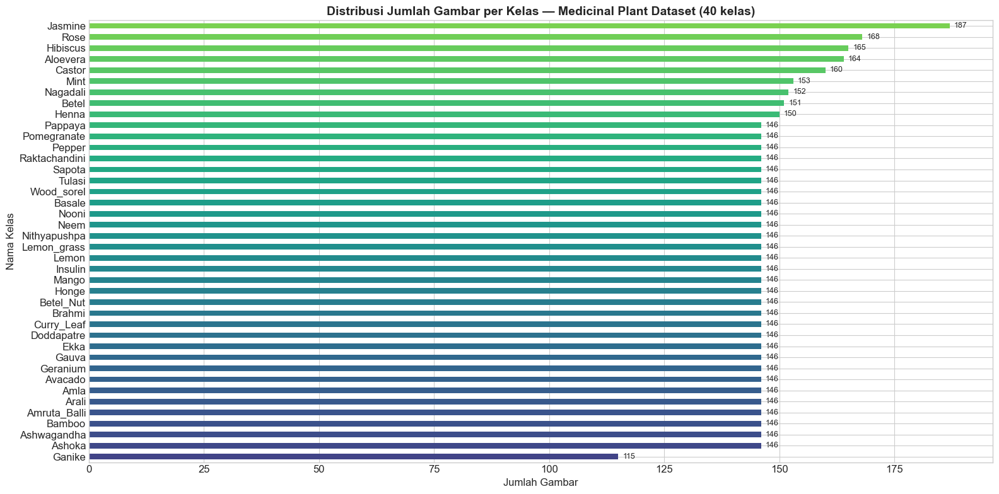


📊 Min gambar/kelas: 115 (Ganike)
📊 Max gambar/kelas: 187 (Jasmine)
📊 Rata-rata: 148.6
📊 Std deviasi: 9.9


In [42]:
fig, axes = plt.subplots(1, 1, figsize=(16, 8))

class_counts_plant = df_plant['class_name'].value_counts().sort_values(ascending=True)
colors = plt.cm.viridis(np.linspace(0.2, 0.8, len(class_counts_plant)))

class_counts_plant.plot(kind='barh', ax=axes, color=colors)
axes.set_title('Distribusi Jumlah Gambar per Kelas — Medicinal Plant Dataset (40 kelas)', fontsize=14, fontweight='bold')
axes.set_xlabel('Jumlah Gambar')
axes.set_ylabel('Nama Kelas')

# Tambahkan angka di ujung bar
for i, (v, name) in enumerate(zip(class_counts_plant.values, class_counts_plant.index)):
    axes.text(v + 1, i, str(v), va='center', fontsize=9)

plt.tight_layout()
plt.savefig(str(BASE_DIR / 'reports' / 'eda' / 'eda_distribusi_kelas_plant.png'), dpi=150, bbox_inches='tight')
plt.show()
print(f"\n📊 Min gambar/kelas: {class_counts_plant.min()} ({class_counts_plant.idxmin()})")
print(f"📊 Max gambar/kelas: {class_counts_plant.max()} ({class_counts_plant.idxmax()})")
print(f"📊 Rata-rata: {class_counts_plant.mean():.1f}")
print(f"📊 Std deviasi: {class_counts_plant.std():.1f}")


### [CELL 6] — Cek Distribusi Gambar per Kelas (Dataset 80 Kelas)

Menganalisis keseimbangan data pada kelas Leaf. Semakin banyak kelas, rasio ketidakseimbangan biasanya makin parah.
<br><sub>**Penjelasan Output:** Rata-rata (*mean*) menyatakan nilai wajar jumlah gambar per kelas.</sub>

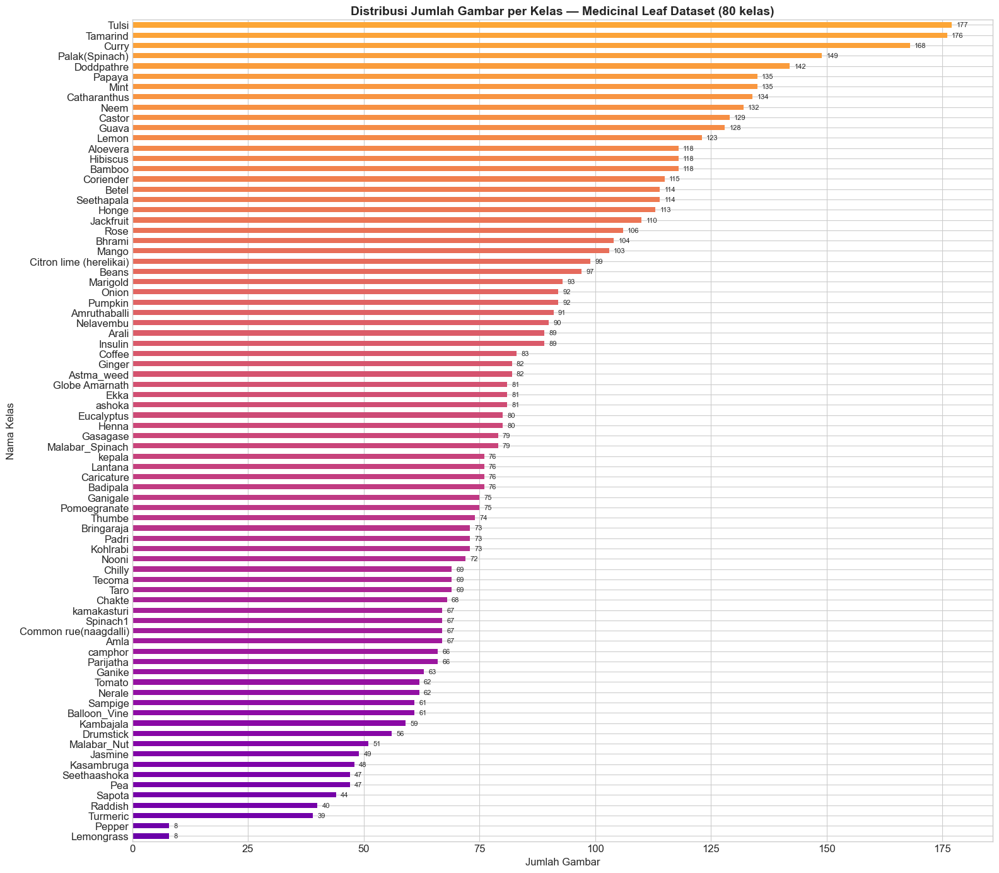


📊 Min gambar/kelas: 8 (Lemongrass)
📊 Max gambar/kelas: 177 (Tulsi)
📊 Rata-rata: 86.2


In [43]:
fig, axes = plt.subplots(1, 1, figsize=(16, 14))

class_counts_leaf = df_leaf['class_name'].value_counts().sort_values(ascending=True)
colors = plt.cm.plasma(np.linspace(0.2, 0.8, len(class_counts_leaf)))

class_counts_leaf.plot(kind='barh', ax=axes, color=colors)
axes.set_title('Distribusi Jumlah Gambar per Kelas — Medicinal Leaf Dataset (80 kelas)', fontsize=14, fontweight='bold')
axes.set_xlabel('Jumlah Gambar')
axes.set_ylabel('Nama Kelas')

for i, (v, name) in enumerate(zip(class_counts_leaf.values, class_counts_leaf.index)):
    axes.text(v + 1, i, str(v), va='center', fontsize=8)

plt.tight_layout()
plt.savefig(str(BASE_DIR / 'reports' / 'eda' / 'eda_distribusi_kelas_leaf.png'), dpi=150, bbox_inches='tight')
plt.show()
print(f"\n📊 Min gambar/kelas: {class_counts_leaf.min()} ({class_counts_leaf.idxmin()})")
print(f"📊 Max gambar/kelas: {class_counts_leaf.max()} ({class_counts_leaf.idxmax()})")
print(f"📊 Rata-rata: {class_counts_leaf.mean():.1f}")


### [CELL 7] — Menghitung Angka Ketimpangan (Imbalance Ratio)

Menghitung rasio kelas Mayoritas dibagi kelas Minoritas secara pasti.
<br><sub>**Kenapa rasio penting?** Rasio di atas angka 3x artinya *imbalanced*. Solusinya adalah *Class Weights* di tahap Preprocessing nanti.</sub>
<br><sub>**Penjelasan Output:** Alat peringatan otomatis status ketimpangan secara matematis.</sub>

In [44]:
for name, df_temp in [("Plant", df_plant), ("Leaf", df_leaf)]:
    counts = df_temp['class_name'].value_counts()
    imbalance_ratio = counts.max() / counts.min()
    print(f"\n📊 {name} Dataset — Imbalance Ratio: {imbalance_ratio:.2f}x")
    if imbalance_ratio > 3:
        print(f"   ⚠️  Dataset cukup imbalanced! Pertimbangkan teknik balancing")
    else:
        print(f"   ✅ Dataset relatif balanced")



📊 Plant Dataset — Imbalance Ratio: 1.63x
   ✅ Dataset relatif balanced

📊 Leaf Dataset — Imbalance Ratio: 22.12x
   ⚠️  Dataset cukup imbalanced! Pertimbangkan teknik balancing


### [CELL 8] — Cek Ukuran Gambar (Resolusi)

Menampilkan frekuensi berbagai ukuran dimensi (Lebar x Tinggi) gambar.
<br><sub>**Kenapa butuh ini?** Model Deep Learning wajib menerima input kotak dengan ukuran pasti (misalnya 224 x 224 pixel). Jika persegi panjang, kita wajib menggunakan teknik *Resize*.</sub>
<br><sub>**Penjelasan Output:** Garis merah putus adalah target 224px. Kurva yang ada memperlihatkan dimensi asli.</sub>

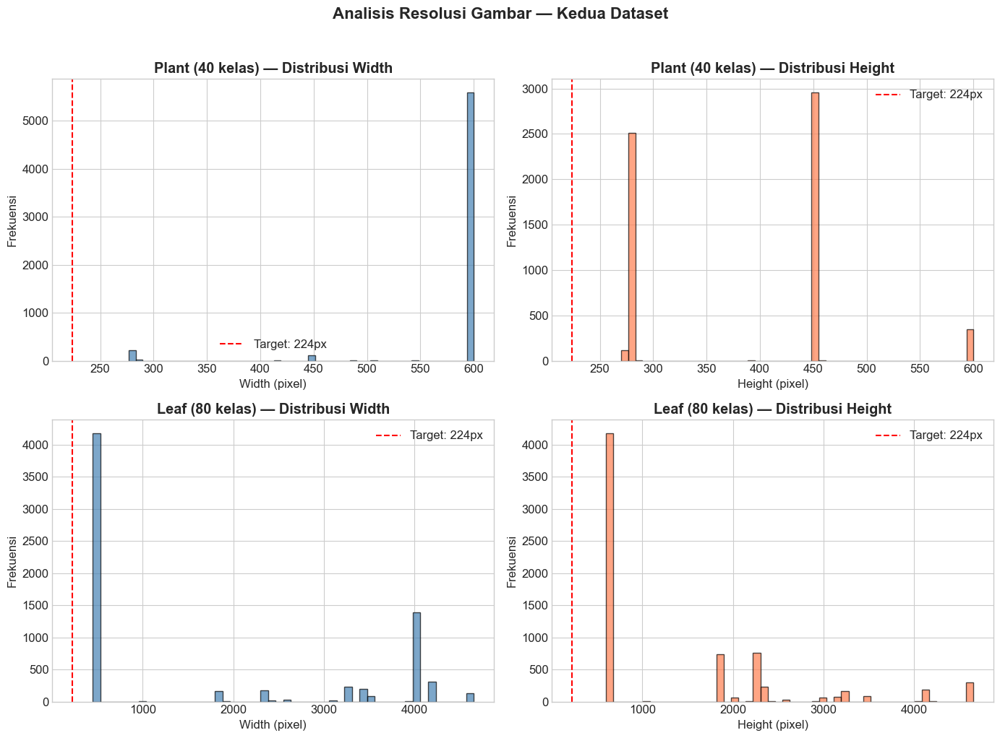


📐 Plant Dataset:
   Width  — Min: 277, Max: 600, Mean: 584
   Height — Min: 270, Max: 600, Mean: 384

📐 Leaf Dataset:
   Width  — Min: 450, Max: 4656, Mean: 1723
   Height — Min: 600, Max: 4656, Mean: 1424


In [45]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

for idx, (name, df_temp) in enumerate([("Plant (40 kelas)", df_plant), ("Leaf (80 kelas)", df_leaf)]):
    # Histogram width
    axes[idx, 0].hist(df_temp['width'], bins=50, color='steelblue', alpha=0.7, edgecolor='black')
    axes[idx, 0].set_title(f'{name} — Distribusi Width', fontweight='bold')
    axes[idx, 0].set_xlabel('Width (pixel)')
    axes[idx, 0].set_ylabel('Frekuensi')
    axes[idx, 0].axvline(x=224, color='red', linestyle='--', label='Target: 224px')
    axes[idx, 0].legend()
    
    # Histogram height
    axes[idx, 1].hist(df_temp['height'], bins=50, color='coral', alpha=0.7, edgecolor='black')
    axes[idx, 1].set_title(f'{name} — Distribusi Height', fontweight='bold')
    axes[idx, 1].set_xlabel('Height (pixel)')
    axes[idx, 1].set_ylabel('Frekuensi')
    axes[idx, 1].axvline(x=224, color='red', linestyle='--', label='Target: 224px')
    axes[idx, 1].legend()

plt.suptitle('Analisis Resolusi Gambar — Kedua Dataset', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(str(BASE_DIR / 'reports' / 'eda' / 'eda_resolusi_gambar.png'), dpi=150, bbox_inches='tight')
plt.show()

for name, df_temp in [("Plant", df_plant), ("Leaf", df_leaf)]:
    print(f"\n📐 {name} Dataset:")
    print(f"   Width  — Min: {df_temp['width'].min()}, Max: {df_temp['width'].max()}, Mean: {df_temp['width'].mean():.0f}")
    print(f"   Height — Min: {df_temp['height'].min()}, Max: {df_temp['height'].max()}, Mean: {df_temp['height'].mean():.0f}")


### [CELL 9] — Melihat Wujud Asli Gambar (Dataset Plant)

Menampilkan galeri mini dari gambar spesimen daun secara random.
<br><sub>**Kenapa dicek visual?** Agar kita tahu bayangan dan intensitas noise / gangguan di latar foto sebelum diajarkan ke AI.</sub>

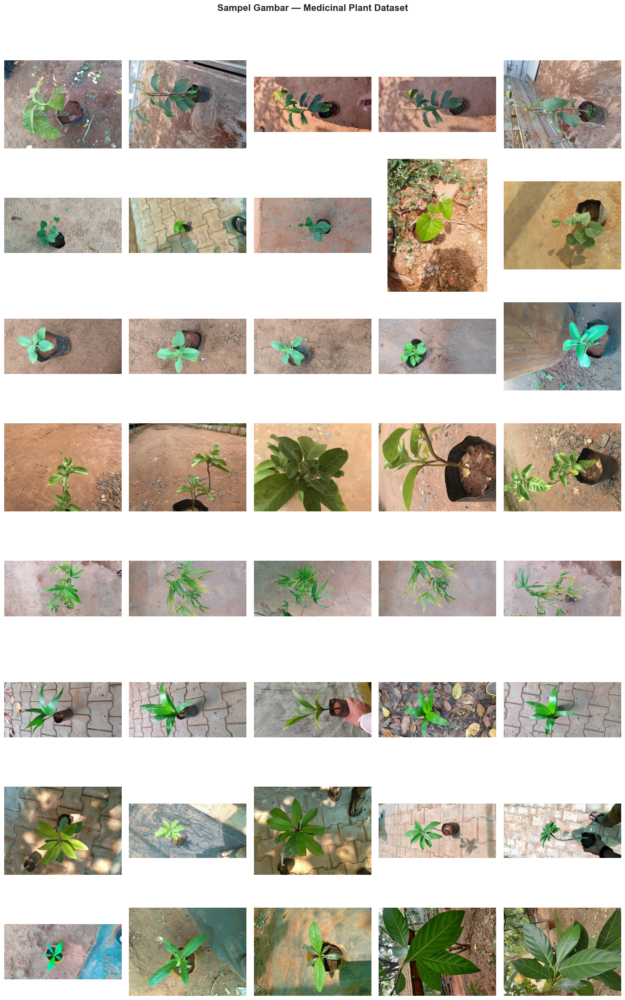

In [46]:
def show_sample_images(dataset_path, classes, n_classes=10, n_samples=5, title=""):
    """Menampilkan grid sampel gambar dari beberapa kelas"""
    selected_classes = random.sample(classes, min(n_classes, len(classes)))
    
    fig, axes = plt.subplots(n_classes, n_samples, figsize=(n_samples * 3, n_classes * 3))
    fig.suptitle(title, fontsize=16, fontweight='bold', y=1.01)
    
    for i, class_name in enumerate(selected_classes):
        class_dir = os.path.join(dataset_path, class_name)
        images = glob.glob(os.path.join(class_dir, "*.*"))
        selected = random.sample(images, min(n_samples, len(images)))
        
        for j in range(n_samples):
            ax = axes[i, j] if n_classes > 1 else axes[j]
            if j < len(selected):
                try:
                    img = Image.open(selected[j])
                    ax.imshow(img)
                    if j == 0:
                        ax.set_ylabel(class_name, rotation=0, labelpad=80, fontsize=10, fontweight='bold')
                except:
                    ax.text(0.5, 0.5, 'Error', ha='center', va='center')
            ax.axis('off')
    
    plt.tight_layout()
    return fig

plant_classes = sorted(os.listdir(PLANT_DATASET_DIR))
fig = show_sample_images(PLANT_DATASET_DIR, plant_classes, n_classes=8, n_samples=5,
                         title="Sampel Gambar — Medicinal Plant Dataset")
plt.savefig(str(BASE_DIR / 'reports' / 'eda' / 'eda_sampel_plant.png'), dpi=150, bbox_inches='tight')
plt.show()


### [CELL 10] — Melihat Wujud Asli Gambar (Dataset Leaf)

Inspeksi kemurnian subdataset kedua.
<br><sub>**Kenapa ini penting?** Terkadang di satu folder terdapat objek keliru, kita harus _senses check_ secara sederhana.</sub>

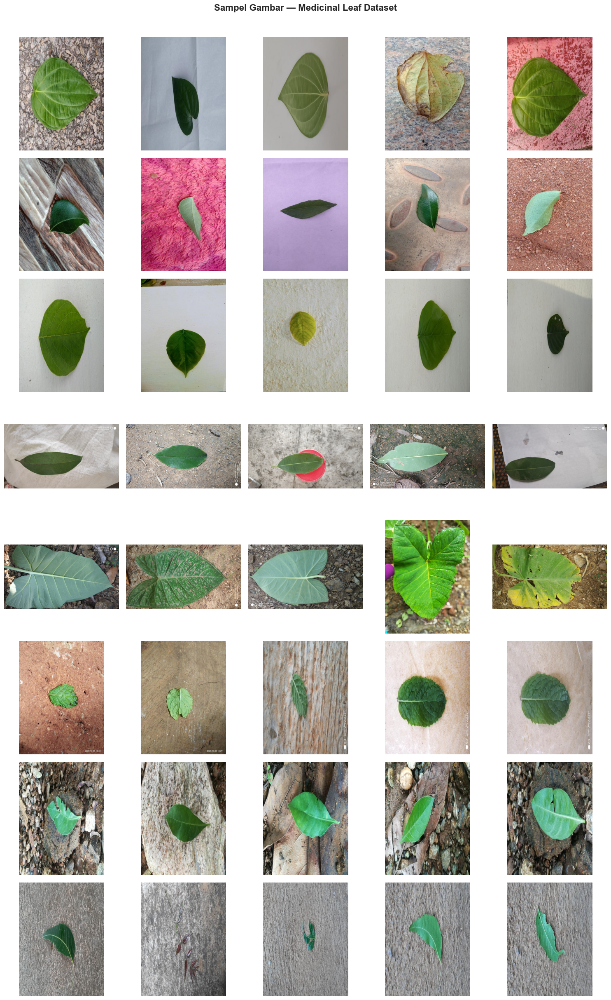

In [47]:
leaf_classes = sorted(os.listdir(LEAF_DATASET_DIR))
fig = show_sample_images(LEAF_DATASET_DIR, leaf_classes, n_classes=8, n_samples=5,
                         title="Sampel Gambar — Medicinal Leaf Dataset")
plt.savefig(str(BASE_DIR / 'reports' / 'eda' / 'eda_sampel_leaf.png'), dpi=150, bbox_inches='tight')
plt.show()


### [CELL 11] — Statistik Warna RGB (Fundamental Transfer Learning)

Mengekstrasi *Mean* & *Std* rata-rata kepadatan saluran Red, Green, Blue dari gambar.
<br><sub>**Kenapa warna perlu distatistik?** Kita pakai Transfer Learning dari ImageNet. Gambar ImageNet punya standar kecerahan sendiri. Agar model tidak kaget menangkap visual daun kita, kita akan menyesuaikan distribusinya.</sub>
<br><sub>**Penjelasan Output:** Wajar jika *Green* lebih padat distribusinya karena dominan klorofil dedaunan.</sub>


🎨 Medicinal Plant Dataset — RGB Statistics (dari 500 sampel):
   Mean: R=0.5722, G=0.5513, B=0.4492
   Std:  R=0.2012, G=0.1705, B=0.1811

   📝 ImageNet default — Mean: [0.485, 0.456, 0.406], Std: [0.229, 0.224, 0.225]


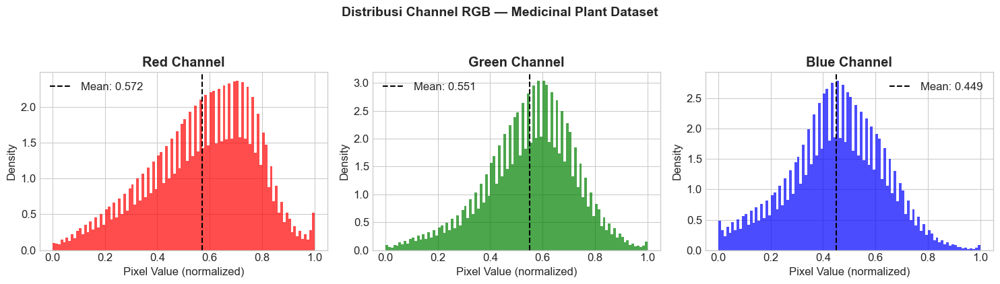


🎨 Medicinal Leaf Dataset — RGB Statistics (dari 500 sampel):
   Mean: R=0.5519, G=0.5309, B=0.4783
   Std:  R=0.2011, G=0.1943, B=0.2057

   📝 ImageNet default — Mean: [0.485, 0.456, 0.406], Std: [0.229, 0.224, 0.225]


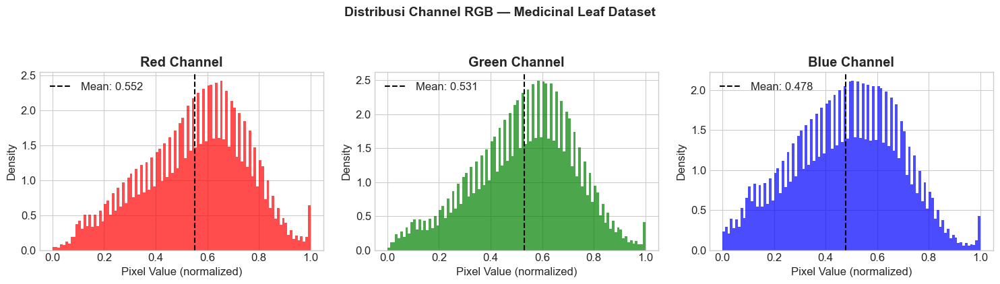

In [48]:
def compute_rgb_statistics(df, dataset_name, sample_size=500):
    """
    Menghitung mean dan std per channel RGB dari sampel gambar.
    Ini akan digunakan untuk normalisasi saat training.
    """
    sampled = df.sample(min(sample_size, len(df)), random_state=42)
    
    all_r, all_g, all_b = [], [], []
    
    for _, row in sampled.iterrows():
        try:
            img = Image.open(row['file_path']).convert('RGB').resize((224, 224))
            arr = np.array(img) / 255.0  # Normalize ke [0, 1]
            all_r.extend(arr[:, :, 0].flatten())
            all_g.extend(arr[:, :, 1].flatten())
            all_b.extend(arr[:, :, 2].flatten())
        except:
            continue
    
    stats = {
        'mean': [np.mean(all_r), np.mean(all_g), np.mean(all_b)],
        'std': [np.std(all_r), np.std(all_g), np.std(all_b)]
    }
    
    print(f"\n🎨 {dataset_name} — RGB Statistics (dari {len(sampled)} sampel):")
    print(f"   Mean: R={stats['mean'][0]:.4f}, G={stats['mean'][1]:.4f}, B={stats['mean'][2]:.4f}")
    print(f"   Std:  R={stats['std'][0]:.4f}, G={stats['std'][1]:.4f}, B={stats['std'][2]:.4f}")
    print(f"\n   📝 ImageNet default — Mean: [0.485, 0.456, 0.406], Std: [0.229, 0.224, 0.225]")
    
    # Visualisasi distribusi
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    for idx, (channel, color, values) in enumerate(zip(['Red', 'Green', 'Blue'], 
                                                        ['red', 'green', 'blue'],
                                                        [all_r, all_g, all_b])):
        axes[idx].hist(values, bins=100, color=color, alpha=0.7, density=True)
        axes[idx].set_title(f'{channel} Channel', fontweight='bold')
        axes[idx].set_xlabel('Pixel Value (normalized)')
        axes[idx].set_ylabel('Density')
        axes[idx].axvline(x=np.mean(values), color='black', linestyle='--', label=f'Mean: {np.mean(values):.3f}')
        axes[idx].legend()
    
    plt.suptitle(f'Distribusi Channel RGB — {dataset_name}', fontsize=14, fontweight='bold', y=1.05)
    plt.tight_layout()
    
    return stats, fig

stats_plant, fig_plant = compute_rgb_statistics(df_plant, "Medicinal Plant Dataset")
plt.savefig(str(BASE_DIR / 'reports' / 'eda' / 'eda_rgb_plant.png'), dpi=150, bbox_inches='tight')
plt.show()

stats_leaf, fig_leaf = compute_rgb_statistics(df_leaf, "Medicinal Leaf Dataset")
plt.savefig(str(BASE_DIR / 'reports' / 'eda' / 'eda_rgb_leaf.png'), dpi=150, bbox_inches='tight')
plt.show()


### [CELL 12] — Mengecek Kebocoran Data (Data Duplikat)

Mendeteksi file ganda di dimensi yang benar-benar identik dalam 1 kelas.
<br><sub>**Kenapa dihindari?** Kalau bocor ke test set, hasil skor akurasi test akan kelihatan palsu (Model menyontek). Hal ini kita sebut sebagai *Model Overfitting / Leakage*.</sub>

In [49]:
def detect_duplicates(df, dataset_name):
    """Deteksi kemungkinan duplikat berdasarkan ukuran file yang identik dalam kelas yang sama"""
    duplicates = df.groupby(['class_name', 'file_size']).filter(lambda x: len(x) > 1)
    n_potential = len(duplicates)
    
    print(f"\n🔍 {dataset_name} — Potensi Duplikat:")
    if n_potential > 0:
        print(f"   ⚠️  {n_potential} file dengan ukuran identik dalam kelas yang sama")
        print(f"   (Ini belum tentu duplikat, perlu verifikasi manual)")
    else:
        print(f"   ✅ Tidak ada potensi duplikat terdeteksi")
    
    return duplicates

dup_plant = detect_duplicates(df_plant, "Medicinal Plant")
dup_leaf = detect_duplicates(df_leaf, "Medicinal Leaf")



🔍 Medicinal Plant — Potensi Duplikat:
   ⚠️  138 file dengan ukuran identik dalam kelas yang sama
   (Ini belum tentu duplikat, perlu verifikasi manual)

🔍 Medicinal Leaf — Potensi Duplikat:
   ⚠️  96 file dengan ukuran identik dalam kelas yang sama
   (Ini belum tentu duplikat, perlu verifikasi manual)


### [CELL 13] — Pengecekan Format File

Memeriksa file RGB (JPEG) atau RGBA/Grayscale (PNG/B&W).
<br><sub>**Alasan:** PyTorch butuh 3 channel tensor konstan. Kalau ada format salah/abu-abu, program akan crash!</sub>

In [50]:
for name, df_temp in [("Plant", df_plant), ("Leaf", df_leaf)]:
    print(f"\n📷 {name} Dataset:")
    print(f"   Format gambar: {df_temp['format'].value_counts().to_dict()}")
    print(f"   Mode gambar:   {df_temp['mode'].value_counts().to_dict()}")
    print(f"   File size — Min: {df_temp['file_size'].min()/1024:.1f} KB, "
          f"Max: {df_temp['file_size'].max()/1024:.1f} KB, "
          f"Mean: {df_temp['file_size'].mean()/1024:.1f} KB")



📷 Plant Dataset:
   Format gambar: {'JPEG': 5945}
   Mode gambar:   {'RGB': 5945}
   File size — Min: 10.7 KB, Max: 145.4 KB, Mean: 43.5 KB

📷 Leaf Dataset:
   Format gambar: {'JPEG': 6900}
   Mode gambar:   {'RGB': 6900}
   File size — Min: 9.0 KB, Max: 8532.4 KB, Mean: 1342.2 KB


### [CELL 14] — Simulasi Augmentasi Data Sintetis

Menyimulasikan modifikasi citra: dirotasi, dimajukan kecerahannya, dll.
<br><sub>**Tujuannya apa?** Agar si model deep learning *Tebak daun dari sudut manapun tetap kuat*, sehingga tidak gampang diakali walau fotonya miring (Kebal terhadap real-world data).</sub>

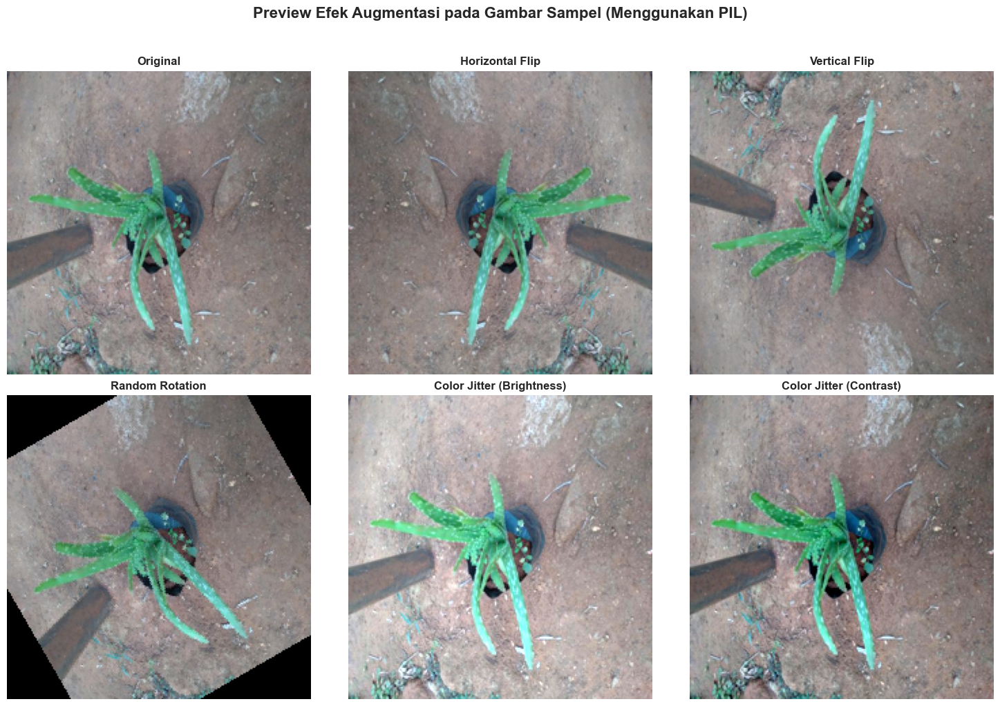

In [ ]:

# demonstrasi di Python 3.13 menggunakanPillow (PIL)
from PIL import ImageEnhance, ImageOps

sample_img_path = df_plant.iloc[0]['file_path']
sample_img = Image.open(sample_img_path).convert('RGB').resize((224, 224))

# Definisi augmentasi manual menggunakan PIL
augmentations = {
    'Original': sample_img,
    'Horizontal Flip': ImageOps.mirror(sample_img),
    'Vertical Flip': ImageOps.flip(sample_img),
    'Random Rotation': sample_img.rotate(30, expand=False), # Rotate 30 degree
    'Color Jitter (Brightness)': ImageEnhance.Brightness(sample_img).enhance(1.3),
    'Color Jitter (Contrast)': ImageEnhance.Contrast(sample_img).enhance(1.3),
}

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, (name, augmented) in enumerate(augmentations.items()):
    axes[idx].imshow(augmented)
    axes[idx].set_title(name, fontsize=12, fontweight='bold')
    axes[idx].axis('off')

plt.suptitle('Preview Efek Augmentasi pada Gambar Sampel (Menggunakan PIL)', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(str(BASE_DIR / 'reports' / 'eda' / 'eda_preview_augmentasi.png'), dpi=150, bbox_inches='tight')
plt.show()

### [CELL 15] — Kesimpulan Data (EDA)

Ringkasan rencana aksi dan justifikasi rasio Split data.
<br><sub>**Kenapa Train 80% / Test 20%?** <br>Metode Industri Standar. Model butuh '*buku pelajaran*' mayoritas (80%) tuk memahami semua ciri daun. Sementara 20% dipakai *Full Testing Buta* sebagai simulasi kehandalan produk aslinya tanpa mencurangi memori.</sub>

In [52]:
print("""
╔══════════════════════════════════════════════════════════════╗
║                    📊 RINGKASAN EDA                         ║
╠══════════════════════════════════════════════════════════════╣
║                                                              ║
║  Dataset 1: Medicinal Plant Dataset                          ║
║    - Jumlah kelas: 40                                        ║
║    - Total gambar: (lihat output di atas)                    ║
║    - Digunakan sebagai dataset UTAMA                         ║
║                                                              ║
║  Dataset 2: Medicinal Leaf Dataset                           ║
║    - Jumlah kelas: 80                                        ║
║    - Total gambar: (lihat output di atas)                    ║
║    - Digunakan sebagai dataset UTAMA (gabungan)              ║
║                                                              ║
║  Preprocessing yang akan diterapkan:                         ║
║    ✅ Resize ke 224×224 pixel                                ║
║    ✅ Normalisasi (ImageNet mean & std)                      ║
║    ✅ Augmentasi: flip, rotate, color jitter                 ║
║    ✅ Split: 80% train, 20% test                            ║
║                                                              ║
║  Next Step: → 02_training_mobilenetv2.ipynb                  ║
╚══════════════════════════════════════════════════════════════╝
""")



╔══════════════════════════════════════════════════════════════╗
║                    📊 RINGKASAN EDA                         ║
╠══════════════════════════════════════════════════════════════╣
║                                                              ║
║  Dataset 1: Medicinal Plant Dataset                          ║
║    - Jumlah kelas: 40                                        ║
║    - Total gambar: (lihat output di atas)                    ║
║    - Digunakan sebagai dataset UTAMA                         ║
║                                                              ║
║  Dataset 2: Medicinal Leaf Dataset                           ║
║    - Jumlah kelas: 80                                        ║
║    - Total gambar: (lihat output di atas)                    ║
║    - Digunakan sebagai dataset UTAMA (gabungan)              ║
║                                                              ║
║  Preprocessing yang akan diterapkan:                         ║
║    ✅ Resize ke 224×224 p